In [ ]:
!pip install pycocotools opencv-python scikit-learn

import os
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models

print("TensorFlow version:", tf.__version__)

In [16]:
# ==========================
# Compile model with BCE + Dice Loss
# ==========================
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def bce_dice_loss(y_true, y_pred):
    bce = tf.keras.losses.BinaryCrossentropy()(y_true, y_pred)
    return bce + dice_loss(y_true, y_pred)

model = build_unet((128, 128, 3))
model.compile(optimizer='adam', loss=bce_dice_loss, metrics=['accuracy'])
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      2,320 │ conv2d[0][0]      │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │      4,640 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │      9,248 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │     18,496 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 16,    │     73,856 │ max_pooling2d_2[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 16,    │    147,584 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 32, 32,    │          0 │ conv2d_7[0][0]    │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 32, 32,    │          0 │ up_sampling2d[0]… │
│ (Concatenate)       │ 192)              │            │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 32, 32,    │    110,656 │ concatenate[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_8[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 64, 64,    │          0 │ conv2d_9[0][0]  

 Total params: 487,297 (1.86 MB)

 Trainable params: 487,297 (1.86 MB)

 Non-trainable params: 0 (0.00 B)

In [18]:
loss, accuracy = model.evaluate(X_val, y_val)
print(f"Validation Accuracy: {accuracy:.2f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.8014 - loss: 1.2746
Validation Accuracy: 0.81


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step


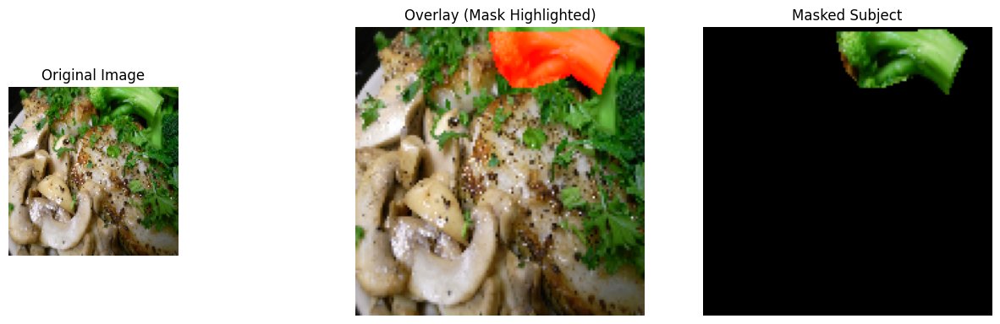

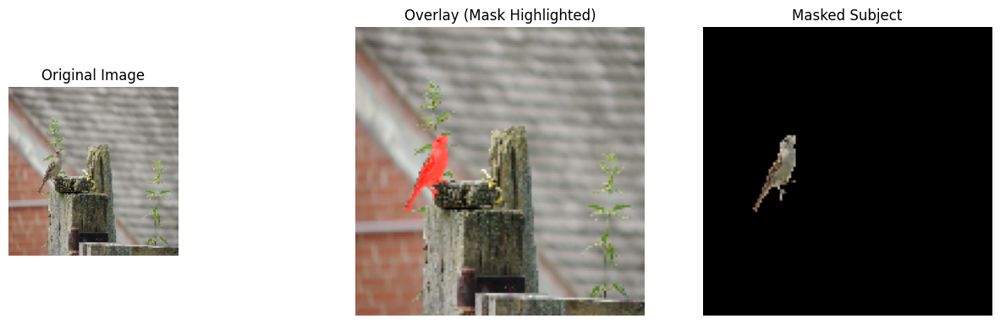

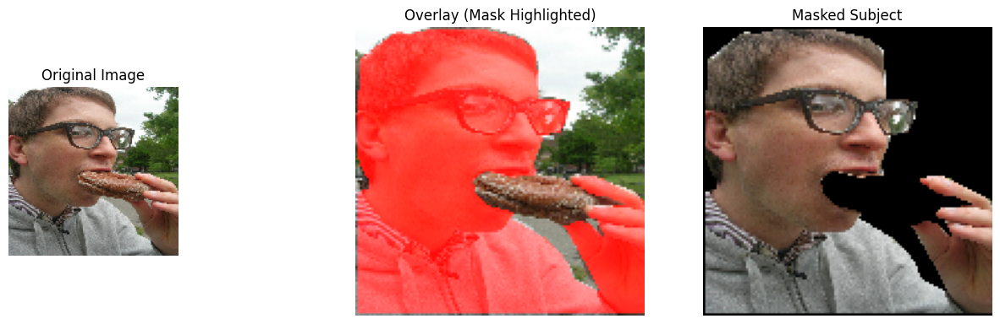

In [20]:
# ==========================
# Week 4: Show Real Image and Masked Image (like your notebook)
# ==========================

# Generate predictions
preds_val = model.predict(X_val)

# Convert predictions into binary masks
binary_preds = (preds_val > 0.5).astype(np.uint8)

# Show results
# Pick some random samples from dataset
import cv2

for i in range(3):  # show 3 examples
    idx = random.randint(0, len(X)-1)
    original_img = X[idx]
    mask = y[idx].squeeze()

    # Subject cutout (background black)
    masked_img = original_img * np.expand_dims(mask, axis=-1)

    # Overlay mask in red with transparency
    overlay = original_img.copy()
    overlay[mask == 1] = [255, 0, 0]  # red overlay
    overlay = cv2.addWeighted(original_img, 0.7, overlay, 0.3, 0)

    plt.figure(figsize=(15,5))

    # Original
    plt.subplot(1,5,1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis("off")

    # Transparent Overlay
    plt.subplot(1,3,2)
    plt.imshow(overlay)
    plt.title("Overlay (Mask Highlighted)")
    plt.axis("off")

    # Subject Cutout
    plt.subplot(1,3,3)
    plt.imshow(masked_img)
    plt.title("Masked Subject")
    plt.axis("off")

    plt.show()



loading annotations into memory...
Done (t=2.49s)
creating index...
index created!


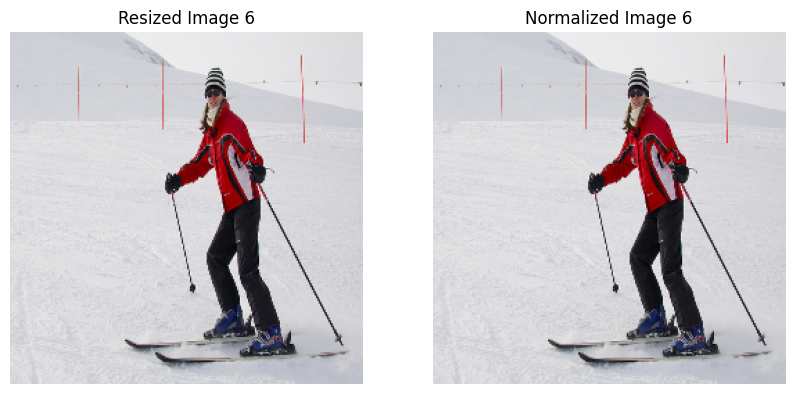

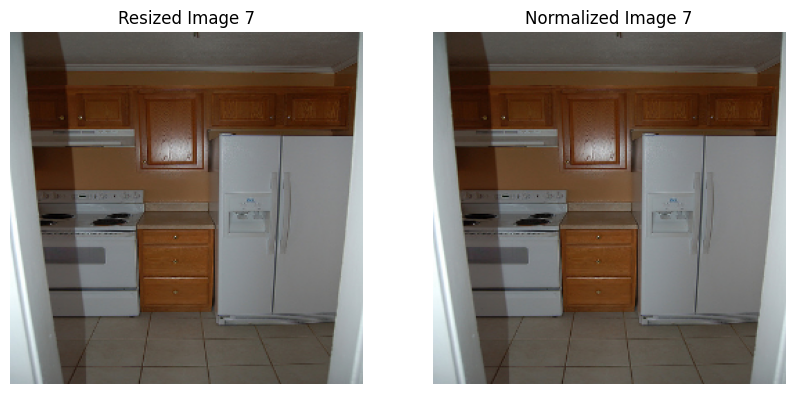

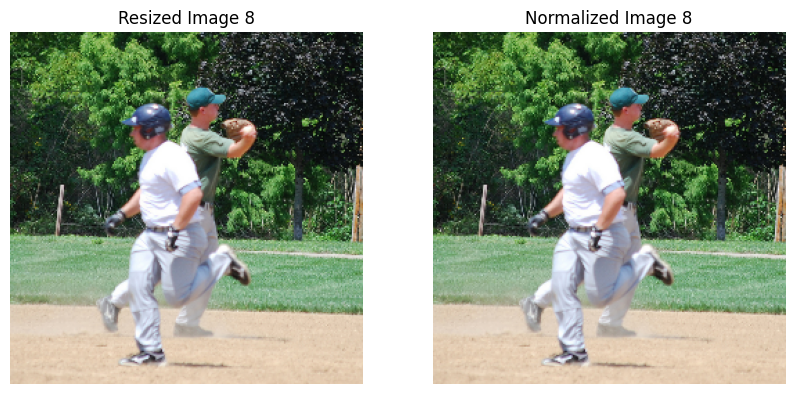

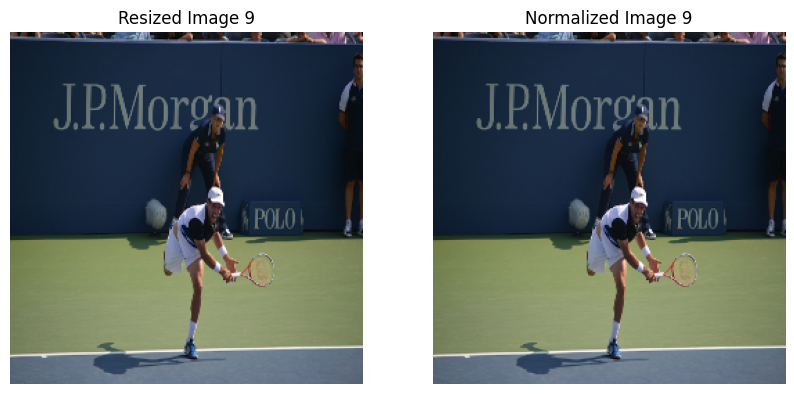

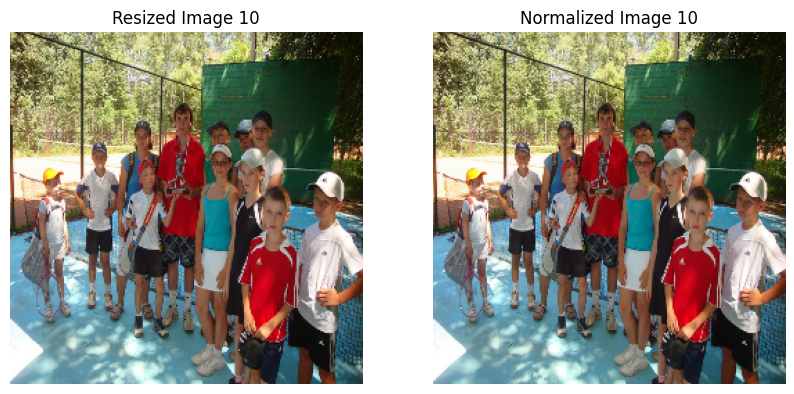

In [35]:
import cv2
import numpy as np
import glob
import os
from pycocotools.coco import COCO
from skimage.io import imread
import matplotlib.pyplot as plt

# ================================
# Paths
# ================================
val_dir = "/content/val2017"
ann_file = "/content/annotations/instances_val2017.json"
resize_shape = (255, 255)

# Load COCO
coco = COCO(ann_file)
val_images = sorted(glob.glob(os.path.join(val_dir, "*.jpg")))

# ================================
# Select images from index 6 to 15
# ================================
start_idx = 5  # 0-based index → 7th image
end_idx = 10   # exclusive → 15th index
selected_images = val_images[start_idx:end_idx]

# ================================
# Process & display selected images
# ================================
for idx, img_path in enumerate(selected_images, start=start_idx):

    # Load image
    img = imread(img_path)
    if img.ndim == 2:  # grayscale → RGB
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    # Resize image
    img_resized = cv2.resize(img, resize_shape)

    # Normalize image to [0,1]
    img_normalized = img_resized.astype(np.float32) / 255.0

    # Display resized and normalized side by side
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(img_resized)
    plt.title(f"Resized Image {idx+1}")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(img_normalized)
    plt.title(f"Normalized Image {idx+1}")
    plt.axis("off")
    plt.show()


loading annotations into memory...
Done (t=2.17s)
creating index...
index created!


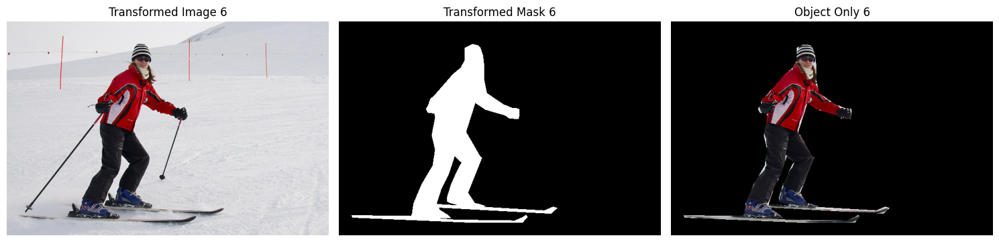

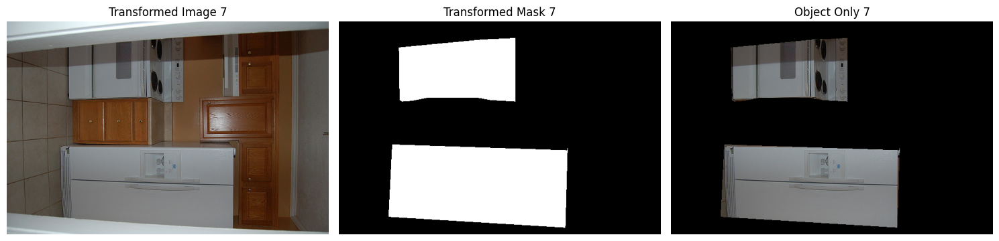

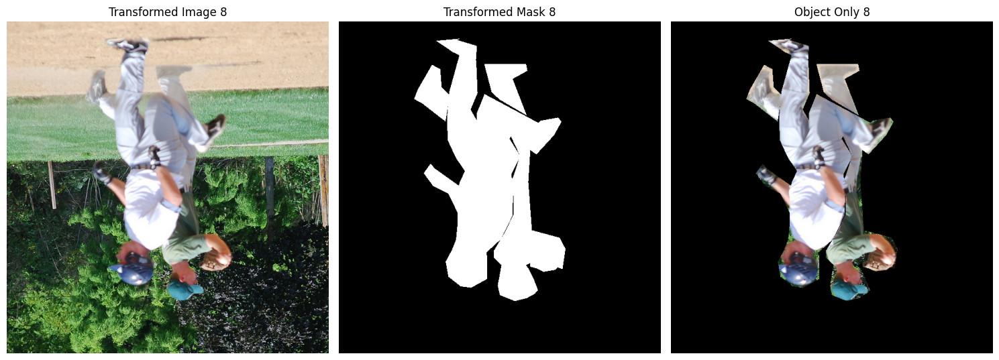

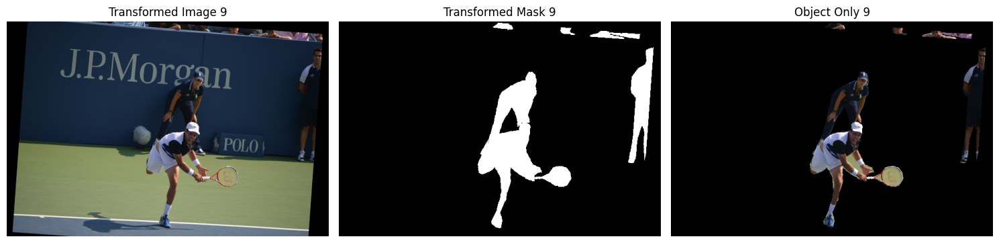

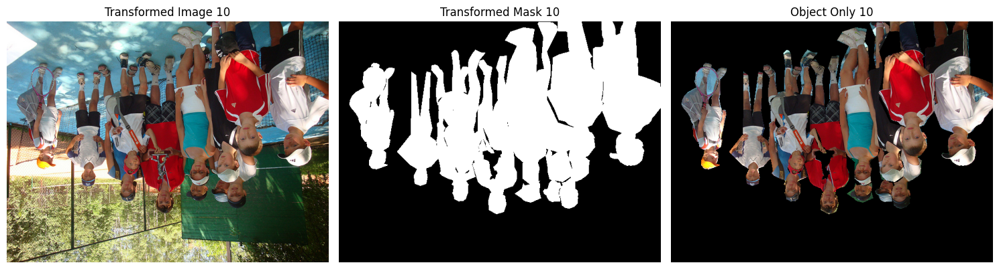

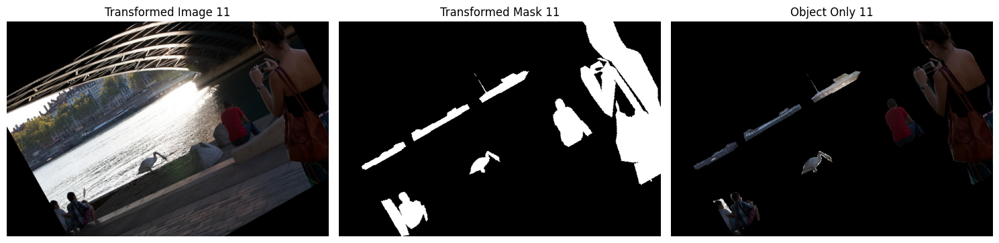

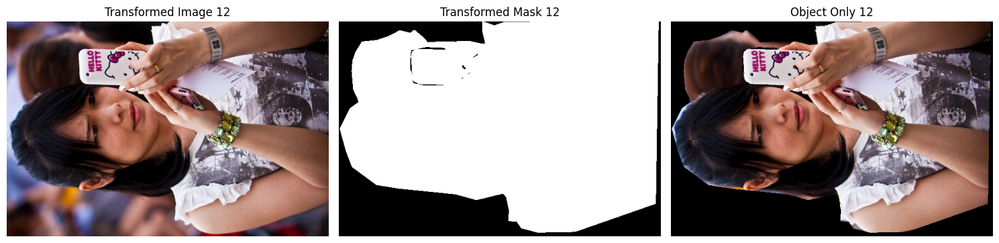

In [38]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
from pycocotools.coco import COCO

# ==========================
# COCO paths
# ==========================
data_dir = "./"
ann_file = os.path.join(data_dir, "annotations", "instances_val2017.json")
img_dir = os.path.join(data_dir, "val2017")

coco = COCO(ann_file)

# ==========================
# Albumentations pipeline
# ==========================
augmenter = A.OneOf([
    A.HorizontalFlip(p=1.0),
    A.VerticalFlip(p=1.0),
    A.RandomRotate90(p=1.0),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=30, p=1.0)
], p=1.0)

# ==========================
# Select images 6–15
# ==========================
img_ids = sorted(coco.getImgIds())
for count, img_id in enumerate(img_ids[5:12], start=6):  # 6th to 15th
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info["file_name"])

    # Load original image in high resolution
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Build mask from annotations
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)
    mask = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))

    # Apply augmentation (flip/rotate) to both image & mask
    transformed = augmenter(image=img, mask=mask)
    aug_img, aug_mask = transformed["image"], transformed["mask"]

    # Object-only view
    obj_only = aug_img * np.expand_dims(aug_mask, axis=-1)

    # ==========================
    # Plot (clear high-res)
    # ==========================
    fig, axes = plt.subplots(1, 3, figsize=(15, 6))
    titles = [f"Transformed Image {count}", f"Transformed Mask {count}", f"Object Only {count}"]
    data = [aug_img, aug_mask, obj_only]
    cmaps = [None, "gray", None]

    for ax, d, title, cmap in zip(axes, data, titles, cmaps):
        ax.imshow(d, cmap=cmap)
        ax.set_title(title)
        ax.axis("off")

    plt.tight_layout()
    plt.show()


loading annotations into memory...
Done (t=2.61s)
creating index...
index created!


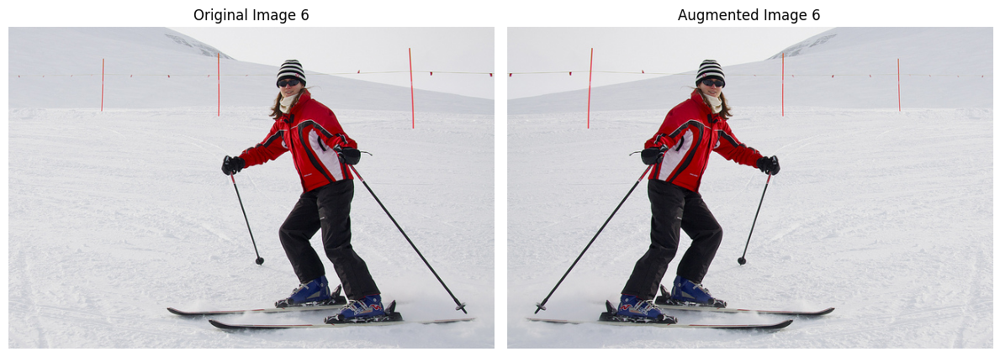

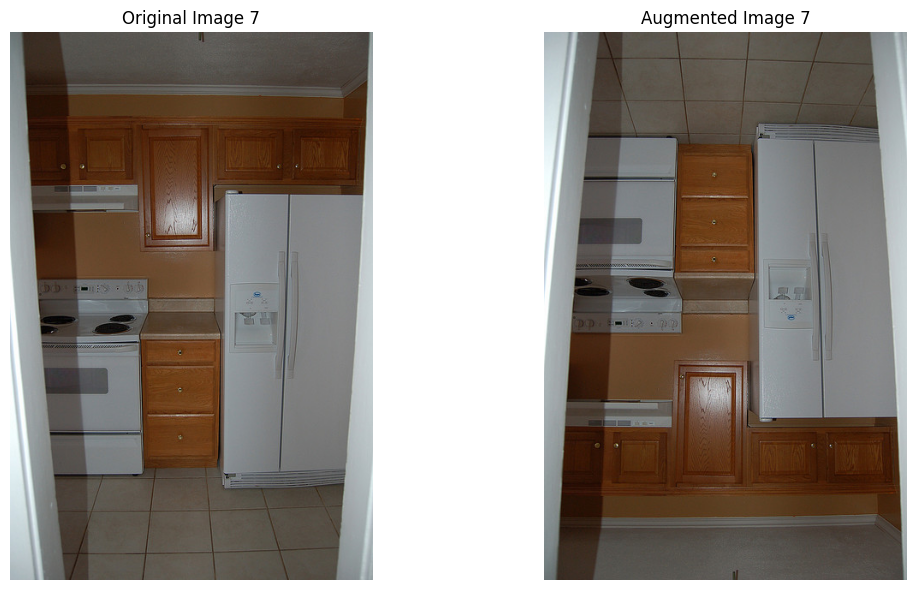

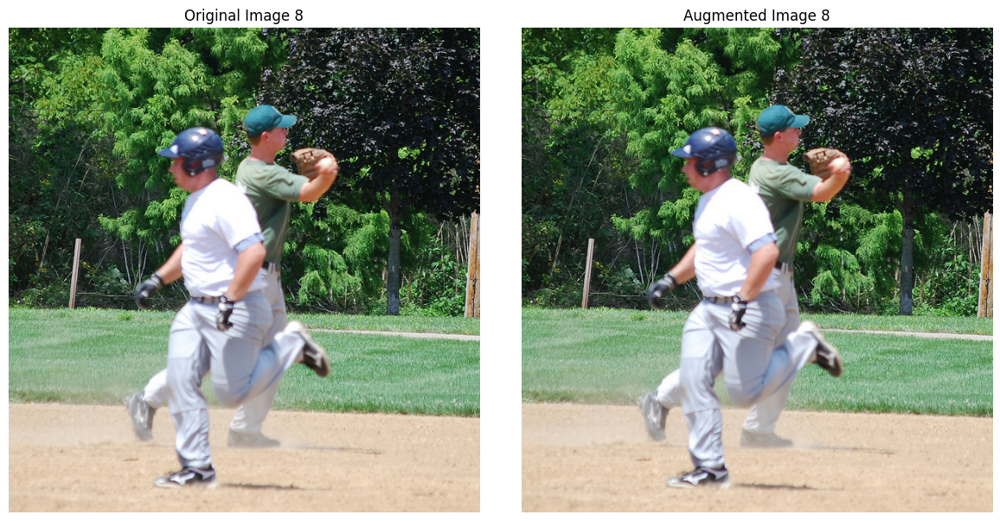

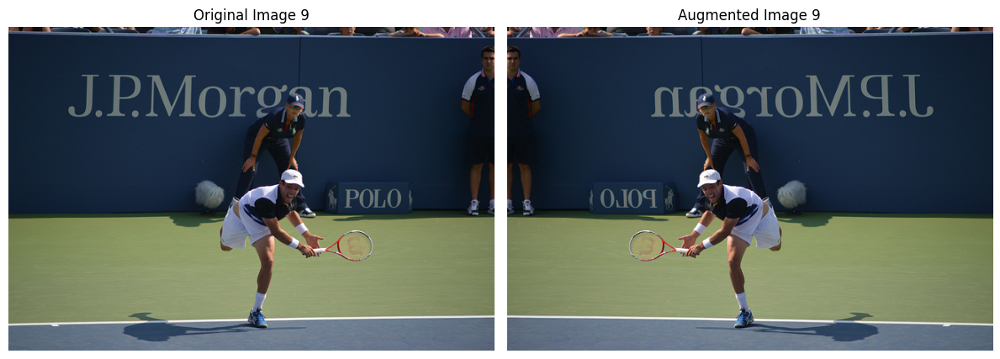

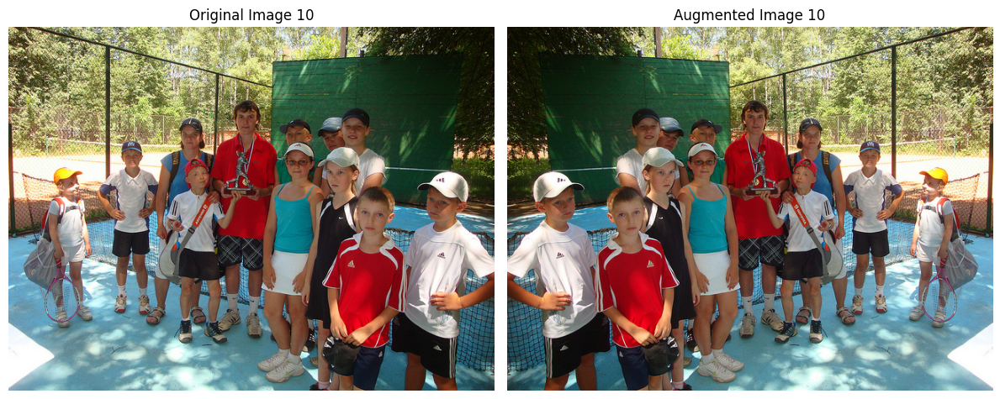

In [37]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
from pycocotools.coco import COCO

# ==========================
# COCO paths
# ==========================
data_dir = "./"
ann_file = os.path.join(data_dir, "annotations", "instances_val2017.json")
img_dir = os.path.join(data_dir, "val2017")

coco = COCO(ann_file)

# ==========================
# Albumentations pipeline (flips + rotations)
# ==========================
augmenter = A.OneOf([
    A.HorizontalFlip(p=1.0),
    A.VerticalFlip(p=1.0),
    A.RandomRotate90(p=1.0),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=30, p=1.0)
], p=1.0)

# ==========================
# Show images 6 to 15
# ==========================
img_ids = sorted(coco.getImgIds())
for count, img_id in enumerate(img_ids[5:10], start=6):  # 6th to 15th
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info["file_name"])

    # Load original image in high resolution
    original_img = cv2.imread(img_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    # Apply augmentation (flips / rotation)
    transformed = augmenter(image=original_img)
    aug_img = transformed["image"]

    # ==========================
    # Plot: Original vs Augmented
    # ==========================
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(original_img)
    axes[0].set_title(f"Original Image {count}")
    axes[0].axis("off")

    axes[1].imshow(aug_img)
    axes[1].set_title(f"Augmented Image {count}")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()


In [33]:
import tensorflow as tf
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt

# ===========================
# 1. IoU Metric Function
# ===========================
def iou_metric(y_true, y_pred, smooth=1e-6):
    # Convert predictions to binary mask
    y_pred = K.cast(y_pred > 0.5, 'float32')
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

# ===========================
# 2. Compile Model
# ===========================
model.compile(
    optimizer="adam",
    loss="binary_crossentropy",
    metrics=[iou_metric]
)

# ===========================
# 3. Train Model
# ===========================
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=8,
    batch_size=8,
    verbose=1
)

# ===========================
# 5. Final Results Summary
# ===========================
print("\n📊 Final Metrics After Training")
print(f"➡ Train Loss     : {history.history['loss'][-1]:.4f} (lower means predictions are closer to ground truth)")
print(f"➡ Train IoU      : {history.history['iou_metric'][-1]:.4f} (higher means better overlap with masks)")
print(f"➡ Validation Loss: {history.history['val_loss'][-1]:.4f} (generalization on unseen data)")
print(f"➡ Validation IoU : {history.history['val_iou_metric'][-1]:.4f} (quality of segmentation on unseen data)")

# ===========================
# 6. Per-epoch Table (Optional)
# ===========================
print("\n📑 Metrics per Epoch:")
print("Epoch | Train Loss | Train IoU | Val Loss | Val IoU")
print("-"*50)
for epoch in range(len(history.history['loss'])):
    print(f"{epoch+1:5d} | {history.history['loss'][epoch]:10.4f} | {history.history['iou_metric'][epoch]:9.4f} | "
          f"{history.history['val_loss'][epoch]:9.4f} | {history.history['val_iou_metric'][epoch]:8.4f}")


Epoch 1/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - iou_metric: 0.0099 - loss: 0.4591 - val_iou_metric: 0.0031 - val_loss: 0.4459
Epoch 2/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - iou_metric: 0.0205 - loss: 0.4748 - val_iou_metric: 0.0927 - val_loss: 0.4493
Epoch 3/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 87s 2s/step - iou_metric: 0.0697 - loss: 0.4071 - val_iou_metric: 0.0014 - val_loss: 0.4567
Epoch 4/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 77s 2s/step - iou_metric: 0.0126 - loss: 0.4379 - val_iou_metric: 0.0066 - val_loss: 0.4644
Epoch 5/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - iou_metric: 0.0409 - loss: 0.4294 - val_iou_metric: 0.0048 - val_loss: 0.4431
Epoch 6/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 84s 2s/step - iou_metric: 0.0212 - loss: 0.4219 - val_iou_metric: 0.0320 - val_loss: 0.4351
Epoch 7/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - iou_metric: 0.0419 - loss: 0.4041 - val_iou_metric: 0.0854 - val_loss: 0.4483
Epoch 8/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - iou_metric: 0.0504 - loss: 0.4418 - val_iou_me

In [27]:
import tensorflow as tf
from tensorflow.keras import backend as K
import time

# ===========================
# IoU Metric
# ===========================
def iou_metric(y_true, y_pred, smooth=1e-6):
    y_pred = K.cast(y_pred > 0.5, 'float32')
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

model.compile(optimizer="adam", loss="binary_crossentropy", metrics=[iou_metric])

# ===========================
# Custom Progress Logger Callback
# ===========================
class ProgressLogger(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.start_time = time.time()

    def on_epoch_end(self, epoch, logs=None):
        elapsed = time.time() - self.start_time
        print(f"Epoch {epoch+1}/{self.params['epochs']}")
        print(f"[Train]: 100% | Train Loss: {logs['loss']:.4f}, "
              f"Train IoU: {logs['iou_metric']:.4f} | "
              f"Val Loss: {logs['val_loss']:.4f}, "
              f"Val IoU: {logs['val_iou_metric']:.4f} | "
              f"Time: {elapsed/60:.2f} min")

# ===========================
# Train with Progress Logger
# ===========================
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=10,
    batch_size=8,
    verbose=0,  # disable default Keras bar
    callbacks=[ProgressLogger()]
)


Epoch 1/10
[Train]: 100% | Train Loss: 0.4602, Train IoU: 0.0000 | Val Loss: 0.4610, Val IoU: 0.0000 | Time: 0.91 min
Epoch 2/10
[Train]: 100% | Train Loss: 0.4491, Train IoU: 0.0000 | Val Loss: 0.4581, Val IoU: 0.0000 | Time: 2.27 min
Epoch 3/10
[Train]: 100% | Train Loss: 0.4468, Train IoU: 0.0070 | Val Loss: 0.4584, Val IoU: 0.0005 | Time: 3.63 min
Epoch 4/10
[Train]: 100% | Train Loss: 0.4560, Train IoU: 0.0001 | Val Loss: 0.4677, Val IoU: 0.0000 | Time: 5.00 min
Epoch 5/10
[Train]: 100% | Train Loss: 0.4482, Train IoU: 0.0045 | Val Loss: 0.4578, Val IoU: 0.0085 | Time: 6.47 min
Epoch 6/10
[Train]: 100% | Train Loss: 0.4378, Train IoU: 0.0109 | Val Loss: 0.4891, Val IoU: 0.0000 | Time: 7.23 min
Epoch 7/10
[Train]: 100% | Train Loss: 0.4384, Train IoU: 0.0191 | Val Loss: 0.4611, Val IoU: 0.0000 | Time: 8.61 min
Epoch 8/10
[Train]: 100% | Train Loss: 0.4352, Train IoU: 0.0223 | Val Loss: 0.4502, Val IoU: 0.0008 | Time: 10.01 min
Epoch 9/10
[Train]: 100% | Train Loss: 0.4329, Train Io

In [28]:
import numpy as np
import tensorflow as tf

# Assume you have a trained model
# model = tf.keras.models.load_model('your_model.h5')

# Example validation data
# X_val: shape (num_samples, height, width, channels)
# y_val: shape (num_samples, height, width, 1)

# Get predictions
preds = model.predict(X_val)  # Shape: (num_samples, H, W, 1)

# Convert predictions to binary mask (threshold at 0.5)
pred_masks = (preds > 0.5).astype(np.uint8)  # Shape: (num_samples, H, W, 1)

# The true masks are already in the correct format (y_val)
true_masks = y_val.astype(np.uint8) # Ensure it's uint8 for comparison

# Pixel accuracy: ratio of correctly predicted pixels across all images
# Flatten the arrays to calculate accuracy across all pixels
pixel_accuracy = np.sum(pred_masks == true_masks) / true_masks.size
print(f"Pixel Accuracy: {pixel_accuracy * 100:.2f}%")

# Validation accuracy (mean over images)
# Calculate accuracy for each image and then take the mean
image_accuracies = np.sum(pred_masks == true_masks, axis=(1, 2, 3)) / (true_masks.shape[1] * true_masks.shape[2] * true_masks.shape[3])
val_accuracy = np.mean(image_accuracies)
print(f"Validation Accuracy (Mean over images): {val_accuracy * 100:.2f}%")

2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step
Pixel Accuracy: 80.86%
Validation Accuracy (Mean over images): 80.86%
